# Importing Libraries

In [1]:
import os
import cv2
import tqdm
import glob
import warnings
import itertools
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from pathlib import  Path
from sklearn import metrics
from tensorflow import keras
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.callbacks import TensorBoard
from tensorflow.keras import Model, layers
from sklearn.preprocessing import LabelEncoder
from IPython.display import clear_output as cls
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras import backend, models, layers 
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator
from keras.metrics import sparse_categorical_crossentropy
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
from tensorflow.keras.applications import InceptionResNetV2, Xception, MobileNet, MobileNetV2
from tensorflow.keras.callbacks import Callback, EarlyStopping,ModelCheckpoint, ReduceLROnPlateau
from keras.layers import Activation, Dropout, Conv2D, MaxPooling2D,AveragePooling2D, Flatten, Dense,BatchNormalization
from tensorflow.keras.layers import Dense, Dropout, Conv2D, BatchNormalization,GlobalMaxPooling2D, GlobalAveragePooling2D

# Loading File derectories

In [2]:
# Set display options to show all columns and rows
pd.options.display.max_columns = None
pd.options.display.max_rows = None

#df_dir = r'D:\archive'
#train_dir = r'D:\archive\train'
#test_dir = r'D:\archive\test'
#valid_dir = r'D:\archive\valid'

# Set the directory paths for the dataset
df_dir = r'D:\test_train'
train_dir = r'D:\test_train\train'
test_dir = r'D:\test_train\test'
valid_dir = r'D:\test_train\valid'

# Read in the birds.csv file as a pandas dataframe 
df = pd.read_csv(r'D:\test_train\birds.csv')

# Display the dataframe
#df

# Data Preprocessing

In [3]:
# Printing information about the pandas dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85085 entries, 0 to 85084
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   class id         85085 non-null  int64 
 1   filepaths        85085 non-null  object
 2   labels           85085 non-null  object
 3   data set         85085 non-null  object
 4   scientific name  85085 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.2+ MB


In [4]:
# Count the total number of missing values for each of the columns in the dataframe
df.isnull().sum()

class id           0
filepaths          0
labels             0
data set           0
scientific name    0
dtype: int64

In [5]:
# Getting the count of uniue values in the 'scientific name' column of the dataframe
df['scientific name'].count()

85085

In [6]:
# Count the number of rows in the 'lables' column where the 'data set' column is train
#df['class id'].value_counts().sort_values(ascending=True)
df['labels'][df['data set'] == 'train'].count()

80085

In [7]:
# Count the number of rows in the 'lables' column where the 'data set' column is test
df['labels'][df['data set'] == 'test'].count()

2500

In [8]:
# Count the number of rows in the 'lables' column where the 'data set' column is valid
df['labels'][df['data set'] == 'valid'].count()

2500

In [9]:
# Count the number of occurrences of each label in the 'train' subset of the dataframe
df['labels'][df['data set'] == 'train'].value_counts()

HOUSE FINCH                      248
OVENBIRD                         233
D-ARNAUDS BARBET                 233
SWINHOES PHEASANT                217
WOOD DUCK                        214
CASPIAN TERN                     213
RED BILLED TROPICBIRD            212
WOOD THRUSH                      211
PYRRHULOXIA                      209
FRILL BACK PIGEON                209
MERLIN                           209
ORNATE HAWK EAGLE                208
LAUGHING GULL                    208
MILITARY MACAW                   208
OYSTER CATCHER                   207
EASTERN YELLOW ROBIN             205
JACOBIN PIGEON                   204
DARK EYED JUNCO                  203
GREATER PRAIRIE CHICKEN          203
RED TAILED HAWK                  202
VIOLET GREEN SWALLOW             201
VIOLET BACKED STARLING           201
LIMPKIN                          200
RED KNOT                         200
SORA                             200
PLUSH CRESTED JAY                200
CRIMSON SUNBIRD                  198
C

In [10]:
# Select the rows in the 'data set' column where the value is 'train' and show the first 10 rows
df[df['data set']=='train'].head(10)

,class id,filepaths,labels,data set,scientific name
0,0,train/ABBOTTS BABBLER/001.jpg,ABBOTTS BABBLER,train,Malacocincla abbotti
1,0,train/ABBOTTS BABBLER/002.jpg,ABBOTTS BABBLER,train,Malacocincla abbotti
2,0,train/ABBOTTS BABBLER/003.jpg,ABBOTTS BABBLER,train,Malacocincla abbotti
3,0,train/ABBOTTS BABBLER/004.jpg,ABBOTTS BABBLER,train,Malacocincla abbotti
4,0,train/ABBOTTS BABBLER/005.jpg,ABBOTTS BABBLER,train,Malacocincla abbotti
5,0,train/ABBOTTS BABBLER/006.jpg,ABBOTTS BABBLER,train,Malacocincla abbotti
6,0,train/ABBOTTS BABBLER/007.jpg,ABBOTTS BABBLER,train,Malacocincla abbotti
7,0,train/ABBOTTS BABBLER/008.jpg,ABBOTTS BABBLER,train,Malacocincla abbotti
8,0,train/ABBOTTS BABBLER/009.jpg,ABBOTTS BABBLER,train,Malacocincla abbotti
9,0,train/ABBOTTS BABBLER/010.jpg,ABBOTTS BABBLER,train,Malacocincla abbotti


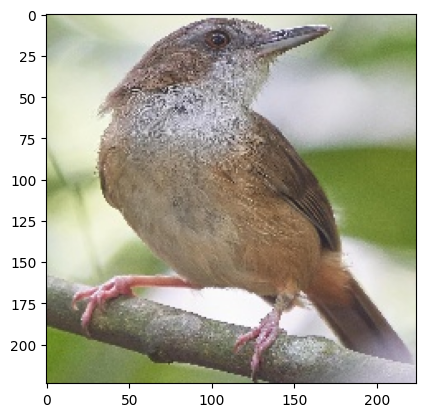

In [11]:
# Read in image using cv2.imread() and store it in the 'image' variable
image = cv2.imread(r'D:\archive\train\ABBOTTS BABBLER\004.jpg')

# Convert the image from BGR format to RGB format using cv2.cvtColor()
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image using plt.imshow()
plt.imshow(image)

In [12]:
# Show the shape of the image
image.shape

(224, 224, 3)

In [13]:
# Get a list of species types by listing the directories in the directory
species_types=os.listdir(train_dir)

# Get the number of species types
len(species_types)

100

### Train

In [14]:
# A path object for the train directory
train_image_dir = Path(train_dir)

# Get the file paths for all JPG files in the train directory and its subdirectories 
train_filepaths = list(train_image_dir.glob(r'**/*JPG'))

# Extract the parent directory names from the file paths to use labels for the images
train_labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1],train_filepaths))
# train_labels

In [15]:
# Convert the train_filepaths list to a pandas series and set the name to 'Filepath' 
train_filepaths = pd.Series(train_filepaths, name='Filepath').astype(str)

# Convert the train_labels list to a pandas series and set the name to 'Label'
t_labels = pd.Series(train_labels,name='Label')

# Concatenate filepaths and labels into a single pandas dataframe
train_df_dir = pd.concat([train_filepaths, t_labels],axis=1)

# Get the length of the resulting dataframe
len(train_df_dir)

15671

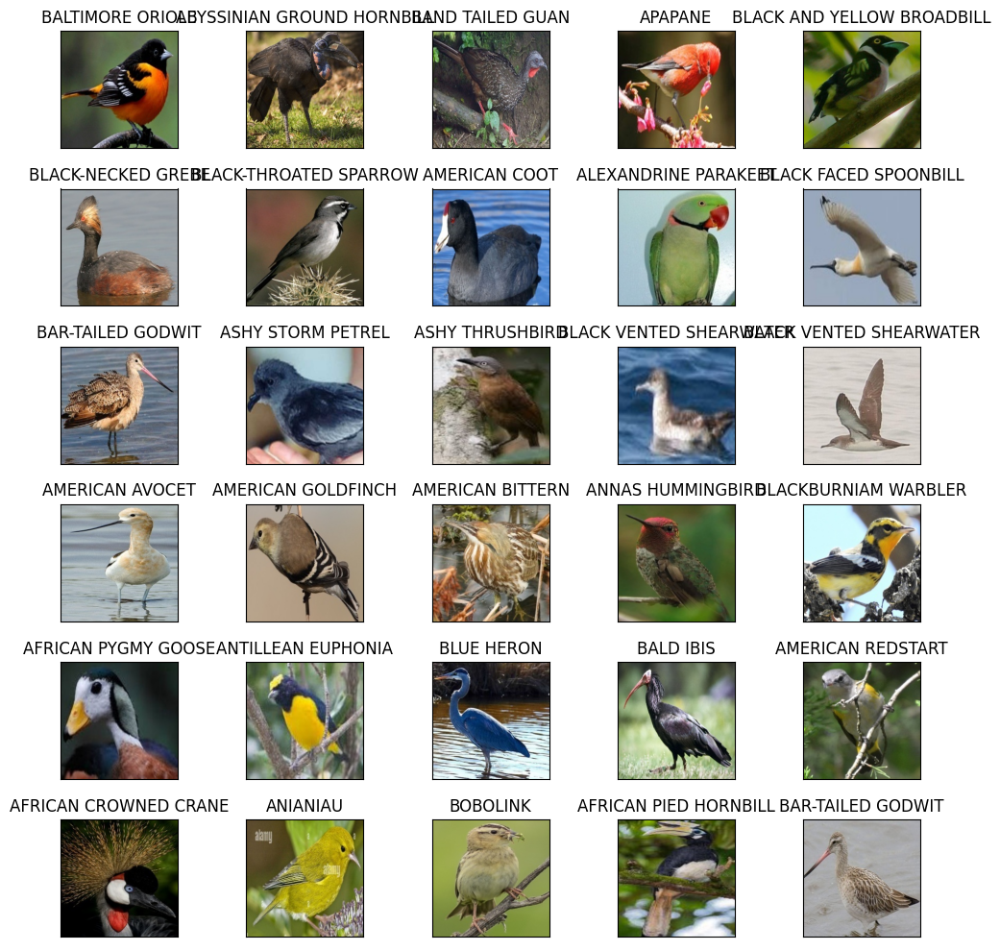

In [16]:
random_index = np.random.randint(5, len(train_df_dir), 30)
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(10,10), 
                        subplot_kw={'xticks':[], 'yticks':[]})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(train_df_dir.Filepath[random_index[i]]))
    ax.set_title(train_df_dir.Label[random_index[i]])
plt.tight_layout()
plt.show()

### Test

In [17]:
# A path object for the test directory
test_image_dir = Path(test_dir)

# Get the file paths for all JPG files in the test directory and its subdirectories 
test_filepaths = list(test_image_dir.glob(r'**/*JPG'))

# Extract the parent directory names from the file paths to use labels for the images
test_labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1],test_filepaths))
#train_labels

In [18]:
# Convert the test_filepaths list to a pandas series and set the name to 'Filepath' 
test_filepaths = pd.Series(test_filepaths, name='Filepath').astype(str)

# Convert the test_labels list to a pandas series and set the name to 'Label'
te_labels = pd.Series(test_labels,name='Label')

# Concatenate filepaths and labels into a single pandas dataframe
test_df_dir = pd.concat([test_filepaths, te_labels],axis=1)
# test_df_dir[test_df_dir['Label']=='ABBOTTS BABBLER']

### Valid

In [19]:
# A path object for the valid directory
valid_image_dir = Path(valid_dir)

# Get the file paths for all JPG files in the valid directory and its subdirectories 
valid_filepaths = list(valid_image_dir.glob(r'**/*JPG'))

# Extract the parent directory names from the file paths to use labels for the images
valid_labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1],valid_filepaths))
#valid_labels

In [20]:
# Convert the valid_filepaths list to a pandas series and set the name to 'Filepath' 
valid_filepaths = pd.Series(valid_filepaths, name='Filepath').astype(str)

# Convert the valid_labels list to a pandas series and set the name to 'Label'
va_labels = pd.Series(valid_labels,name='Label')

# Concatenate filepaths and labels into a single pandas dataframe
valid_df_dir = pd.concat([valid_filepaths, va_labels],axis=1)

# Data Augmentation 

In [21]:
# Creating an ImageDataGenerator object to transform images for training and validation
image_generator = ImageDataGenerator(rotation_range = 20,            # Randomly rotate images by up to 20 degrees
                                    height_shift_range = 0.1,        # Randomly shift the height of images by up to 10%
                                    width_shift_range = 0.1,         # Randomly shift the width of images by up to 10%
                                    shear_range = 0.20,              # Randomly apply shearing transformation to images
                                    zoom_range = 0.20,               # Randomly zoom in or out from images 
                                    fill_mode = 'nearest',           # Fill any new pixels created by transformations with the nearest pixel value
                                    horizontal_flip = True,          # Randomly flip images horizontally
                                    rescale = 1./255,                # Rescale pixel values to be between 0 and 1
                                    validation_split=0.3)            # Split the data into training and validation sets, with 30% used for validation

# Creat an ImageDataGenerator object to rescale images for testing
test_generator = ImageDataGenerator(rescale=1./255)

In [22]:
# Create a training data generator with data augmentation
train_data_gen = image_generator.flow_from_directory(directory=train_dir,
                                                     class_mode = 'categorical',
                                                     subset='training',
                                                     target_size = (224, 224),
                                                     batch_size = 50)

# Create a validation data generator
validation_data_gen = image_generator.flow_from_directory(directory=train_dir,
                                                         subset = 'validation',
                                                         class_mode = 'categorical',
                                                         target_size = (224, 224),
                                                         batch_size = 50)

# Create a test data generator
test_data_gen = test_generator.flow_from_directory(directory=valid_dir, 
                                                   class_mode='categorical', 
                                                   target_size=(224,224) 
                                                   )

Found 11011 images belonging to 100 classes.
Found 4660 images belonging to 100 classes.
Found 1000 images belonging to 100 classes.


In [23]:
def plot_accuracy_loss(history):
    
    # Convert the training history dictionary into a pandas dataframe
    history_df = pd.DataFrame(history.history)
   
    # Plot the training and validation accuracy
    plt.figure(dpi=100, figsize=(9,5))                               # Set the DPI and figure size
    plt.plot(history_df['accuracy'], label='training_accuracy')      # Plot the training accuracy
    plt.plot(history_df['val_accuracy'], label='validation_accuracy')# Plot the validation accuracy
    plt.title('Training and Validation Accuracy', fontsize='12')     # Set the title and font size
    plt.xlabel('Epochs')                                             # Set the x-axis label
    plt.ylabel('Accuracy')                                           # Set the y-axis label
    plt.legend()                                                     # Show the legend
    plt.show()                                                       # Show the plot
   
    # Plot the training and validation loss
    plt.figure(dpi=100, figsize=(9,5))                               # Set the DPI and figure size
    plt.plot(history_df['loss'], label='training_loss')              # Plot the training loss
    plt.plot(history_df['val_loss'], label='validation_loss')        # Plot the validation loss
    plt.title('Training and Validation Loss', fontsize='12')         # Set the title and font size
    plt.xlabel('Epochs')                                             # Set the x-axis label
    plt.ylabel('Loss')                                               # Set the y-axis label
    plt.legend()                                                     # Show the legend
    plt.show()                                                       # Show the plot

In [24]:
def predictImages(data, class_names, model):


    # Set the number of rows and columns for the grid of images
    r, c = 5, 4

    imgLen = r * c


    # Set the size of the figure

    plt.figure(figsize=(20, 15))


    # Initialize the counter for the subplot index

    i = 1


    # Iterate over the dataset to get a batch of images and labels

    for images, labels in iter(data):
        
        # Select a random image from the batch and expand its dimensions to match the model input shape
        id = np.random.randint(len(images))
        img = tf.expand_dims(images[id], axis=0)
        
        # Plot the image with its predicted and actual labels as the title
        plt.subplot(r, c, i)

        plt.imshow(img[0])
        
        # Get the predicted label for the image and convert it to a string class name

        predicted = model.predict(img)

        predicted = class_names[np.argmax(predicted)]
        
        # Get the actual label for the image and convert it to a string class name
        actual = class_names[np.argmax(labels[id])]
        
        # Set the title of the subplot as a string with the actual and predicted labels
        plt.title(f"Actual: {actual}\nPredicted: {predicted}")
        
        # Turn off the axis for the subplot
        plt.axis('off')
        
        # Clear the console
        cls()
        
        # Increment the subplot index counter
        i += 1
        
        # If we have displayed enough images, break out of the loop
        if i > imgLen:
            break
            
    # Show the figure with the grid of images and their predicted and actual labels
    plt.show()

In [25]:
def predict_and_plot_confusion_matrix(data_generator, model, num_samples=1001):
    
    # Generate the class names from the directory structure
    class_names = list(data_generator.class_indices.keys())
    
    # Convert the DirectoryIterator object into a TensorFlow dataset object
    dataset = tf.data.Dataset.from_generator(lambda: data_generator,
                                             output_types=(tf.float32, tf.float32),
                                             output_shapes=([32, 224, 224, 3], [32, 100]))
    
    # Get a batch of images and labels from the data generator
    images = []
    labels = []
    
    for i in range(num_samples // 32):
        batch_images, batch_labels = next(iter(dataset))
        images.append(batch_images)
        labels.append(batch_labels)
        
    # Concatenate the batched images and labels
    images = tf.concat(images, axis=0)
    labels = tf.concat(labels, axis=0)
    
    # Get the predicted and actual labels for the images
    predicted_labels = model.predict(images)
    predicted_labels = np.argmax(predicted_labels, axis=1)
    predicted_labels = [class_names[label] for label in predicted_labels]
    
    actual_labels = np.argmax(labels, axis=1)
    actual_labels = [class_names[label] for label in actual_labels]
    
    # Encode the labels as integers
    le = LabelEncoder()
    le.fit(actual_labels)
    y_true_encoded = le.transform(actual_labels)
    y_pred_encoded = le.transform(predicted_labels)
    
    # Calculate the confusion matrix
    cm = confusion_matrix(y_true_encoded, y_pred_encoded)
    
    # Plot the confusion matrix
    fig, ax = plt.subplots()
    im = ax.imshow(cm, cmap=plt.cm.Blues)
    
    # Customize the plot
    ax.set_xticks(range(len(le.classes_)))
    ax.set_xticklabels(le.classes_, rotation=90)
    ax.set_yticks(range(len(le.classes_)))
    ax.set_yticklabels(le.classes_)
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    ax.set_title('Confusion Matrix')
    
    # Add labels to the plot
    for i in range(len(le.classes_)):
        for j in range(len(le.classes_)):
            text = ax.text(j, i, cm[i, j], ha='center', va='center', color='white')
            
    # Show the plot
    plt.show()
    return actual_labels, predicted_labels

In [26]:
# Set the random seed for Tensor flow to 30
tf.random.set_seed(30)

# Transfer Learning

## MobileNetV2

### Compilation Stage

In [27]:
# Create a sequential model and add a pretrained MobileNetv2 model as the first layer
mobile_model = Sequential()
mobile_model.add(tf.keras.applications.MobileNetV2(
    include_top=False,
    alpha=1.0,
    weights= 'imagenet', input_shape=(224, 224, 3)))

# Set all layers in the MobileNetV2 model to be non-trainable
for layer in mobile_model.layers:
    layer.trainable=False

# Add a Global Average Pooling Layer, a Dropout layer, and a dense output layer to the model
mobile_model.add(GlobalAveragePooling2D())
mobile_model.add(Dropout(0.5)) 
mobile_model.add(Dense(len(species_types), activation="softmax"))

# Print a summary of the model architecture
mobile_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 1280)              0         
                                                                 
 dense (Dense)               (None, 100)               128100    
                                                                 
Total params: 2,386,084
Trainable params: 128,100
Non-trainable params: 2,257,984
_________________________________________________________________


In [28]:
# Compiling a mobile model with Adam optimizer, categorical crossentropy loss and accuracy as the evaluation metric
mobile_model.compile(
    optimizer=Adam(0.0001),           # Setting the learning rate of the Adam optimizer to 0.0001
    loss='categorical_crossentropy',  # Using categorical crossentropy loss for multiclass classification problems
    metrics=['accuracy'])             # Evaluating the model's peformance using accuracy metric

### Checkpoint and Early Stopping

In [29]:
# A callback function to save the best model's weights during training
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
         filepath='best_mobilenetv2.h5',    # file path to save the best model's weights
         save_weights_only=True,            # Save only the model's weights, not the entire model
         monitor='val_loss',                # Monitor the validation loss during training
        mode='max',                         # mode to optimize the monitored metric, here it is set to 'max' as we want to maximize validation loss 
        save_best_only=True)                # save only the best model's weights based on the monitored metric


# callbacks to stop training early if the monitored metric stops improving
# stop training if validation loss doesn't improve after 3 epochs

early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3) 

### Training Stage

In [30]:
# Training the MobileNetV2 model using model.fit()
mobile_history=mobile_model.fit(
    train_data_gen,     # train data generator
    validation_data = validation_data_gen,    # validation data generator
    steps_per_epoch = len(train_data_gen),      # number of steps per epoch, set to the number of batches in the training data
    validation_steps = len(validation_data_gen),# number of steps per epoch, set to the number of batches in the validation data
    epochs = 50,  # number of epochs used to train the data
    callbacks = [model_checkpoint ,early_stopping] #list of callback functions to use during the training
)

Epoch 1/50
221/221 [==============================] - 250s 1s/step - loss: 4.7141 - accuracy: 0.0381 - val_loss: 3.7776 - val_accuracy: 0.1642
Epoch 2/50
221/221 [==============================] - 90s 409ms/step - loss: 3.7265 - accuracy: 0.1429 - val_loss: 3.0320 - val_accuracy: 0.4004
Epoch 3/50
221/221 [==============================] - 79s 358ms/step - loss: 3.0598 - accuracy: 0.2810 - val_loss: 2.5030 - val_accuracy: 0.5423
Epoch 4/50
221/221 [==============================] - 79s 358ms/step - loss: 2.5518 - accuracy: 0.3980 - val_loss: 2.1144 - val_accuracy: 0.6215
Epoch 5/50
221/221 [==============================] - 80s 360ms/step - loss: 2.1917 - accuracy: 0.4840 - val_loss: 1.8437 - val_accuracy: 0.6710
Epoch 6/50
221/221 [==============================] - 82s 371ms/step - loss: 1.9246 - accuracy: 0.5463 - val_loss: 1.6398 - val_accuracy: 0.7002
Epoch 7/50
221/221 [==============================] - 117s 529ms/step - loss: 1.7246 - accuracy: 0.5873 - val_loss: 1.4874 - val_acc

### Checking Overfitting

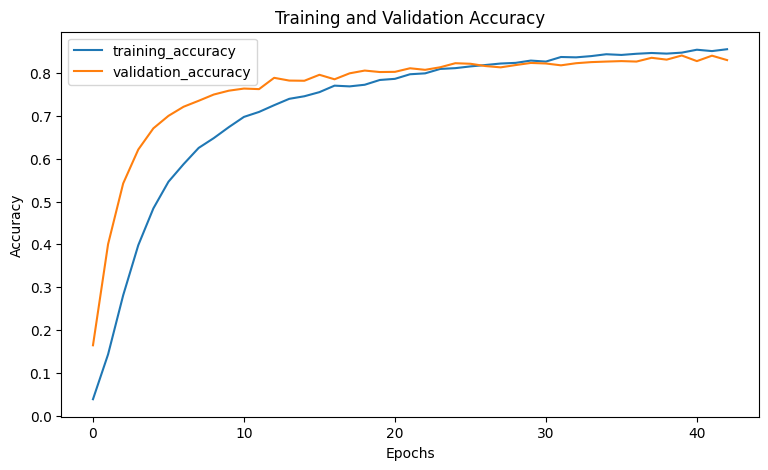

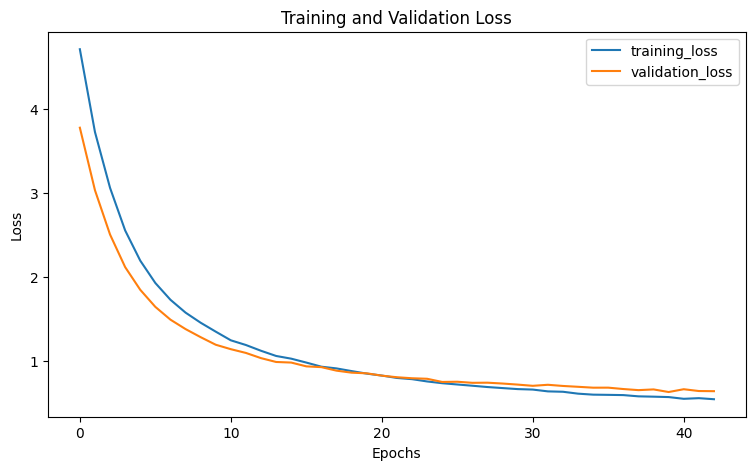

In [31]:
# calling the function to plot the accuracy and loss of the MobileNetV2 model during training
plot_accuracy_loss(mobile_history)

### Evaluation Stage

In [32]:
# Evaluating the performance of the MobileNetV2 model on the test data generator
mobile_model.evaluate(test_data_gen)

32/32 [==============================] - 4s 108ms/step - loss: 0.5030 - accuracy: 0.8840


[0.503038763999939, 0.8840000033378601]

In [33]:
# Using the trained MobileNetV2 to generate predictions on the test dataset
mobile_preds = mobile_model.predict(test_data_gen)

# Print the predicted values
mobile_preds

32/32 [==============================] - 1s 23ms/step


array([[3.48849085e-06, 6.70317153e-04, 2.99261188e-07, ...,
        3.48435128e-06, 2.00414695e-04, 1.00470594e-07],
       [1.94315828e-04, 6.85099221e-05, 1.66023747e-05, ...,
        5.03844785e-06, 3.94913042e-03, 3.45474218e-05],
       [8.62302375e-04, 2.93678331e-05, 1.49662492e-06, ...,
        1.57670846e-04, 9.17451252e-05, 7.01131376e-06],
       ...,
       [7.19611348e-09, 1.78867107e-04, 7.01978635e-08, ...,
        2.65964307e-04, 4.76554845e-07, 5.40890096e-06],
       [6.91469566e-08, 1.10478459e-06, 1.55723842e-06, ...,
        3.94313219e-07, 3.02840455e-08, 2.06007055e-04],
       [1.21241819e-05, 7.38388533e-03, 4.10967841e-05, ...,
        9.75357616e-05, 6.95493596e-04, 2.94264639e-04]], dtype=float32)

## InceptionResNetV2 Model

### Compilation Stage

In [34]:
# Create a sequential model and add a pretrained MobileNetv2 model as the first layer
incep_model = Sequential()
incep_model.add(tf.keras.applications.InceptionResNetV2(
    include_top=False,
    weights= 'imagenet', input_shape=(224, 224, 3)))

# Set all layers in the MobileNetV2 model to be non-trainable
for layer in incep_model.layers:
    layer.trainable=False # Freeze the mobilenet weights.

# Add a Global Average Pooling Layer, a Dropout layer, and a dense output layer to the model
incep_model.add(GlobalAveragePooling2D())
incep_model.add(Dense(len(species_types), activation="softmax"))


# Compiling a mobile model with Adam optimizer, categorical crossentropy loss and accuracy as the evaluation metric
incep_model.compile(loss="categorical_crossentropy",                  # Using categorical crossentropy loss for multiclass classification problems
              optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), # Setting the learning rate of the Adam optimizer to 0.0001
             metrics=['accuracy'])                                    # Evaluating the model's peformance using accuracy metric

# Print a summary of the model architecture
incep_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_resnet_v2 (Functi  (None, 5, 5, 1536)       54336736  
 onal)                                                           
                                                                 
 global_average_pooling2d_1   (None, 1536)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_1 (Dense)             (None, 100)               153700    
                                                                 
Total params: 54,490,436
Trainable params: 153,700
Non-trainable params: 54,336,736
_________________________________________________________________


### Checkpoint and Early Stopping

In [35]:
# A callback function to save the best model's weights during training
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
         filepath='best_inceptionresnetV2.h5',    # file path to save the best model's weights
         save_weights_only=True,                  # Save only the model's weights, not the entire model
         monitor='val_loss',                      # Monitor the validation loss during training
        mode='max',                               # mode to optimize the monitored metric, here it is set to 'max' as we want to maximize validation loss 
        save_best_only=True)                      # save only the best model's weights based on the monitored metric

# callbacks to stop training early if the monitored metric stops improving
# stop training if validation loss doesn't improve after 3 epochs
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)

### Training Stage

In [36]:
# Training the InceptionResNetV2 model using model.fit()
incep_history=incep_model.fit(
    train_data_gen,  # train data generator
    validation_data = validation_data_gen, # validation data generator
    steps_per_epoch = len(train_data_gen), # number of steps per epoch, set to the number of batches in the training data
    validation_steps = len(validation_data_gen), # number of steps per epoch, set to the number of batches in the validation data
    epochs = 50,  # number of epochs used to train the data
    callbacks = [model_checkpoint ,early_stopping]   #list of callback functions to use during the training
)

Epoch 1/50
221/221 [==============================] - 91s 390ms/step - loss: 3.3769 - accuracy: 0.2715 - val_loss: 2.2323 - val_accuracy: 0.5131
Epoch 2/50
221/221 [==============================] - 80s 362ms/step - loss: 1.8384 - accuracy: 0.5847 - val_loss: 1.5491 - val_accuracy: 0.6356
Epoch 3/50
221/221 [==============================] - 80s 364ms/step - loss: 1.3902 - accuracy: 0.6749 - val_loss: 1.2813 - val_accuracy: 0.6828
Epoch 4/50
221/221 [==============================] - 80s 364ms/step - loss: 1.1741 - accuracy: 0.7189 - val_loss: 1.1219 - val_accuracy: 0.7221
Epoch 5/50
221/221 [==============================] - 80s 365ms/step - loss: 1.0523 - accuracy: 0.7423 - val_loss: 1.0288 - val_accuracy: 0.7373
Epoch 6/50
221/221 [==============================] - 80s 363ms/step - loss: 0.9453 - accuracy: 0.7678 - val_loss: 0.9545 - val_accuracy: 0.7502
Epoch 7/50
221/221 [==============================] - 117s 529ms/step - loss: 0.8920 - accuracy: 0.7754 - val_loss: 0.8985 - val_a

### Checking Overfitting

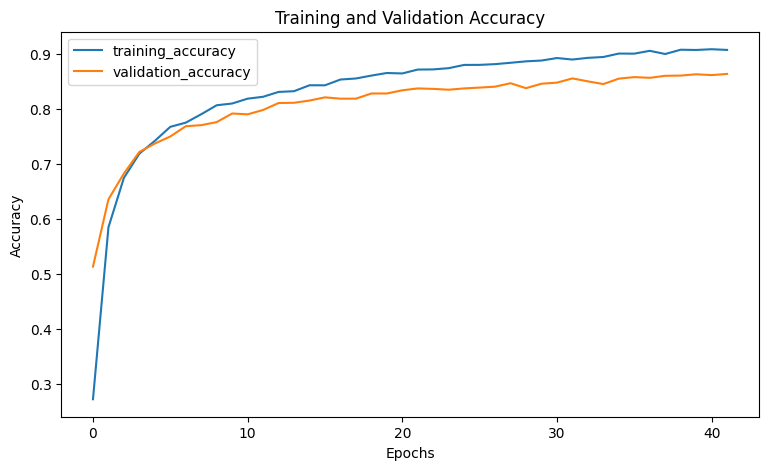

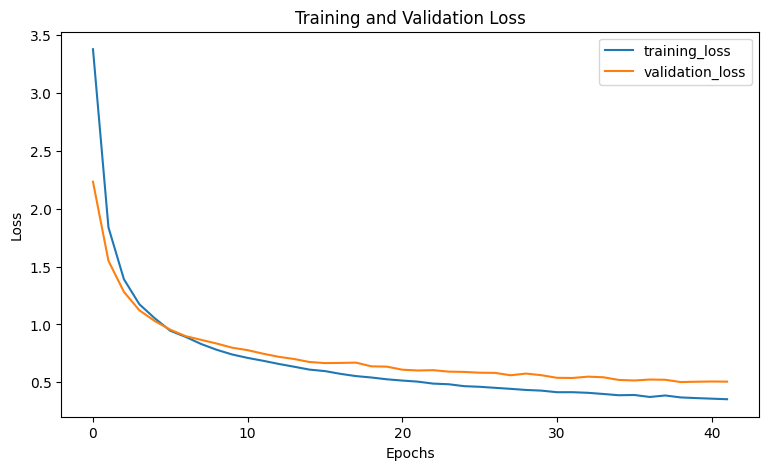

In [37]:
# calling the function to plot the accuracy and loss of the InceptionResNetV2 model during training
plot_accuracy_loss(incep_history)

### Evaluation Stage

In [38]:
# Evaluating the performance of the InceptionResNetV2 model on the test data generator
incep_model.evaluate(test_data_gen)

32/32 [==============================] - 4s 101ms/step - loss: 0.3382 - accuracy: 0.9120


[0.33824238181114197, 0.9120000004768372]

In [39]:
# Using the trained InceptionResNetV2 to generate predictions on the test dataset
incep_preds = incep_model.predict(test_data_gen)

# Print the predicted values
incep_preds

32/32 [==============================] - 3s 55ms/step


array([[8.9233399e-06, 5.6404265e-04, 1.1578343e-06, ..., 1.6008670e-07,
        7.1676271e-03, 4.0073619e-08],
       [1.8561092e-04, 1.1408202e-06, 4.6560733e-09, ..., 1.9629713e-05,
        1.1833983e-03, 6.2280233e-06],
       [3.1208477e-04, 1.3145087e-05, 2.2125162e-08, ..., 2.2666138e-06,
        1.1118252e-03, 9.0604345e-07],
       ...,
       [6.5279276e-10, 1.3331776e-07, 7.3856853e-08, ..., 2.4438748e-04,
        1.8015808e-08, 1.8082572e-03],
       [5.5846089e-05, 7.2034572e-06, 2.0292090e-07, ..., 1.3231822e-04,
        1.2719452e-02, 2.4358606e-06],
       [3.9828674e-06, 6.6620628e-06, 3.8459098e-07, ..., 2.0259206e-06,
        6.9370901e-07, 1.3668732e-06]], dtype=float32)

# Constructed CNNs

In [40]:
# Set a generator to load and preprocess images from the training directory
traindata_gen = image_generator.flow_from_directory(directory=train_dir,
                                                     class_mode = 'categorical',
                                                     subset='training',
                                                     target_size = (160, 160),
                                                     batch_size = 50)

# Set a generator to load and preprocess images from the validation directory
validationdata_gen = image_generator.flow_from_directory(directory=train_dir,
                                                         subset = 'validation',
                                                         class_mode = 'categorical',
                                                         target_size = (160, 160),
                                                         batch_size = 50)

# Set a generator to load and preprocess images from the testing directory
testdata_gen = test_generator.flow_from_directory(directory=valid_dir, 
                                                   class_mode='categorical', 
                                                   target_size=(160,160) 
                                                   )

Found 11011 images belonging to 100 classes.
Found 4660 images belonging to 100 classes.
Found 1000 images belonging to 100 classes.


## Construction Stage

In [41]:
# Clear any existing session from memory
backend.clear_session()

# Define the input shape of the images for the model
input_shape = (160, 160, 3)

# Create a sequential model
seqmodel = keras.Sequential()

# Add the first convolutional layer with 64 filters, 3x3 kernal, and ReLU activation
seqmodel.add(layers.Conv2D(64, (3, 3), activation='relu',padding='same',input_shape=input_shape))
seqmodel.add(layers.BatchNormalization()) # Normalize the output of the convolutionsl layer
seqmodel.add(layers.MaxPooling2D((2, 2))) # Add a 2x2 max pooling layer to reduce dimensionality

# Add the second convolutional layer with 128 filters, 3x3 kernal, and ReLU activation
seqmodel.add(layers.Conv2D(128, (3, 3), activation='relu'))
seqmodel.add(layers.BatchNormalization()) # Normalize the output of the convolutionsl layer
seqmodel.add(layers.MaxPooling2D((2, 2))) # Add a 2x2 max pooling layer to reduce dimensionality

# Add the third convolutional layer with 256 filters, 3x3 kernal, and ReLU activation
seqmodel.add(layers.Conv2D(256, (3, 3), activation='relu'))
seqmodel.add(layers.BatchNormalization()) # Normalize the output of the convolutionsl layer
seqmodel.add(layers.MaxPooling2D((2, 2))) # Add a 2x2 max pooling layer to reduce dimensionality

# Add the fourth convolutional layer with 512 filters, 3x3 kernal, and ReLU activation
seqmodel.add(layers.Conv2D(512, (3, 3), activation='relu'))
seqmodel.add(layers.BatchNormalization()) # Normalize the output of the convolutionsl layer
seqmodel.add(layers.MaxPooling2D((2, 2))) # Add a 2x2 max pooling layer to reduce dimensionality


# Flatten the output from the convolutional layers
seqmodel.add(layers.Flatten())
seqmodel.add(Dropout(0.5)) # Add a dropout layer to prevent overfitting

# Add a fully connected layer with 1024 neurons and ReLU activation
seqmodel.add(layers.Dense(1024, activation='relu'))
seqmodel.add(layers.BatchNormalization()) # Normalize the output of the fully connected layer

# Add an output layer with 100 neurons (one for each class) and softmax activation
seqmodel.add(layers.Dense(100, activation='softmax'))

## Compilation Stage

In [42]:
# Compile the model
seqmodel.compile(optimizer=Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])
# Print the model summary
seqmodel.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 160, 160, 64)      1792      
                                                                 
 batch_normalization (BatchN  (None, 160, 160, 64)     256       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 80, 80, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 78, 78, 128)       73856     
                                                                 
 batch_normalization_1 (Batc  (None, 78, 78, 128)      512       
 hNormalization)                                                 
                                                        

## Training Stage

In [43]:
#fit the sequential model using the training and validation generators
seqhistory = seqmodel.fit( 
    traindata_gen, #training the data
    steps_per_epoch = len(traindata_gen), # number of steps (batches) per epoch
    epochs = 50,  # number of epoch
    validation_data = validationdata_gen, # validation data generator
    validation_steps = len(validationdata_gen), #number of steps (batches) in validation data
    verbose = 1,  # verbosity level of training output
    callbacks=[EarlyStopping(  # earlystopping callback to prevent overfitting
        monitor='val_loss',    # monitor validation loss
        patience = 4,        # number of epochs with no improvement before stopping
        restore_best_weights = True)]) # restore best weights when stopping

Epoch 1/50
221/221 [==============================] - 47s 208ms/step - loss: 4.5726 - accuracy: 0.0577 - val_loss: 5.1347 - val_accuracy: 0.0170
Epoch 2/50
221/221 [==============================] - 45s 206ms/step - loss: 3.6708 - accuracy: 0.1625 - val_loss: 4.3235 - val_accuracy: 0.0770
Epoch 3/50
221/221 [==============================] - 45s 205ms/step - loss: 3.2586 - accuracy: 0.2267 - val_loss: 3.0327 - val_accuracy: 0.2742
Epoch 4/50
221/221 [==============================] - 45s 205ms/step - loss: 2.9813 - accuracy: 0.2725 - val_loss: 2.7693 - val_accuracy: 0.3348
Epoch 5/50
221/221 [==============================] - 45s 205ms/step - loss: 2.7845 - accuracy: 0.3179 - val_loss: 2.6767 - val_accuracy: 0.3489
Epoch 6/50
221/221 [==============================] - 45s 205ms/step - loss: 2.6188 - accuracy: 0.3486 - val_loss: 2.5604 - val_accuracy: 0.3794
Epoch 7/50
221/221 [==============================] - 45s 204ms/step - loss: 2.4815 - accuracy: 0.3724 - val_loss: 2.4468 - val_ac

## Checking Overfitting

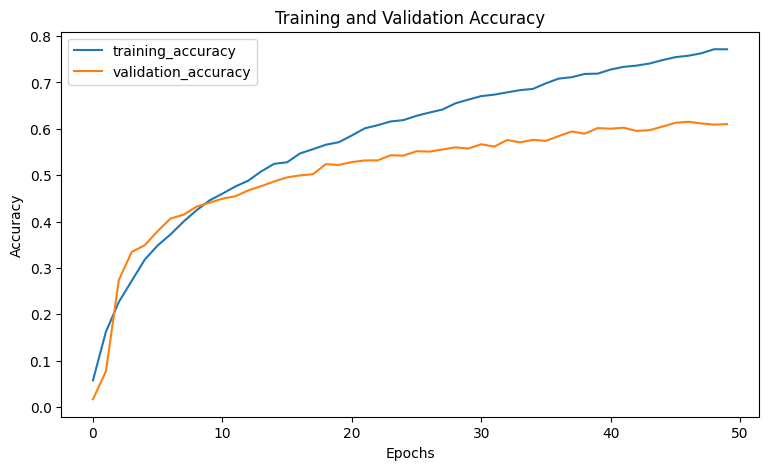

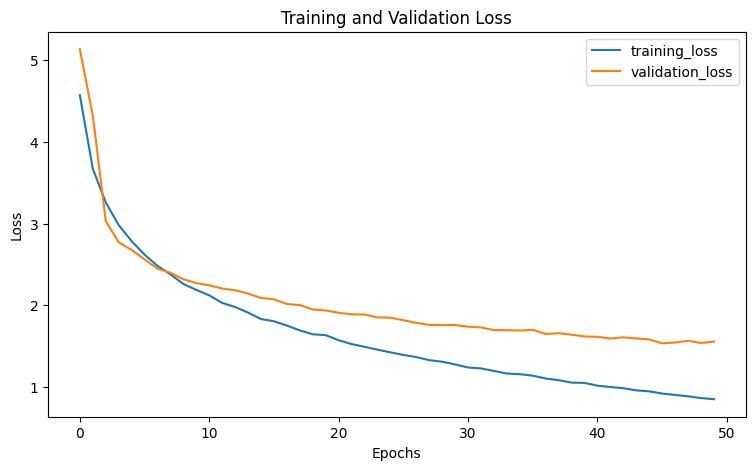

In [44]:
# calling a function to plot accuracy and loss from training history 
plot_accuracy_loss(seqhistory)

## Evaluation Stage

In [45]:
# Evaluating the trained model on the test data generator
seqmodel.evaluate(testdata_gen)

32/32 [==============================] - 3s 88ms/step - loss: 1.4659 - accuracy: 0.6710


[1.4659481048583984, 0.6710000038146973]

In [46]:
# make predictions on the test data using the trained sequential model
seqpreds = seqmodel.predict(testdata_gen)

32/32 [==============================] - 1s 17ms/step


## Construction Sage

In [47]:
# Clear any existing session from memory
backend.clear_session()

# Define the input shape of the images for the model
input_shape = (224, 224, 3)

# Create a sequential model
seqmodel = keras.Sequential()

# Add the first convolutional layer with 64 filters, 3x3 kernal, and ReLU activation
seqmodel.add(layers.Conv2D(64, (3, 3), activation='relu',padding='same',input_shape=input_shape))
seqmodel.add(layers.BatchNormalization()) # Normalize the output of the convolutionsl layer
seqmodel.add(layers.MaxPooling2D((2, 2))) # Add a 2x2 max pooling layer to reduce dimensionality

# Add the second convolutional layer with 128 filters, 3x3 kernal, and ReLU activation
seqmodel.add(layers.Conv2D(128, (3, 3), activation='relu'))
seqmodel.add(layers.BatchNormalization()) # Normalize the output of the convolutionsl layer
seqmodel.add(layers.MaxPooling2D((2, 2))) # Add a 2x2 max pooling layer to reduce dimensionality

# Add the third convolutional layer with 256 filters, 3x3 kernal, and ReLU activation
seqmodel.add(layers.Conv2D(256, (3, 3), activation='relu'))
seqmodel.add(layers.BatchNormalization()) # Normalize the output of the convolutionsl layer
seqmodel.add(layers.MaxPooling2D((2, 2))) # Add a 2x2 max pooling layer to reduce dimensionality

# Add the fourth convolutional layer with 512 filters, 3x3 kernal, and ReLU activation
seqmodel.add(layers.Conv2D(512, (3, 3), activation='relu'))
seqmodel.add(layers.BatchNormalization()) # Normalize the output of the convolutionsl layer
seqmodel.add(layers.MaxPooling2D((2, 2))) # Add a 2x2 max pooling layer to reduce dimensionality


# Flatten the output from the convolutional layers
seqmodel.add(layers.Flatten())
seqmodel.add(Dropout(0.5)) # Add a dropout layer to prevent overfitting

# Add a fully connected layer with 1024 neurons and ReLU activation
seqmodel.add(layers.Dense(1024, activation='relu'))
seqmodel.add(layers.BatchNormalization()) # Normalize the output of the fully connected layer

# Add an output layer with 100 neurons (one for each class) and softmax activation
seqmodel.add(layers.Dense(100, activation='softmax'))

## Compilation Stage

In [48]:
# Compile the model
model.compile(optimizer=Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])
# Print the model summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 batch_normalization (BatchN  (None, 224, 224, 64)     256       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 64)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 110, 110, 128)     73856     
                                                                 
 batch_normalization_1 (Batc  (None, 110, 110, 128)    512       
 hNormalization)                                                 
                                                        

## Training Stage

In [49]:
#fit the sequential model using the training and validation generators
history_seq = model.fit( 
    train_data_gen, #training the data
    steps_per_epoch = len(train_data_gen), # number of steps (batches) per epoch
    epochs = 50,  # number of epoch
    validation_data = validation_data_gen, # validation data generator
    validation_steps = len(validation_data_gen), #number of steps (batches) in validation data
    verbose = 1,  # verbosity level of training output
    callbacks=[EarlyStopping(  # earlystopping callback to prevent overfitting
        monitor='val_loss',    # monitor validation loss
        patience = 4,        # number of epochs with no improvement before stopping
        restore_best_weights = True)]) # restore best weights when stopping

Epoch 1/50
221/221 [==============================] - 104s 468ms/step - loss: 4.2548 - accuracy: 0.1004 - val_loss: 6.0203 - val_accuracy: 0.0139
Epoch 2/50
221/221 [==============================] - 93s 422ms/step - loss: 3.2950 - accuracy: 0.2262 - val_loss: 4.7055 - val_accuracy: 0.0586
Epoch 3/50
221/221 [==============================] - 79s 357ms/step - loss: 2.8700 - accuracy: 0.3031 - val_loss: 2.8409 - val_accuracy: 0.3242
Epoch 4/50
221/221 [==============================] - 79s 356ms/step - loss: 2.6098 - accuracy: 0.3557 - val_loss: 2.5553 - val_accuracy: 0.3815
Epoch 5/50
221/221 [==============================] - 79s 357ms/step - loss: 2.4263 - accuracy: 0.3903 - val_loss: 2.4496 - val_accuracy: 0.4058
Epoch 6/50
221/221 [==============================] - 79s 358ms/step - loss: 2.2580 - accuracy: 0.4264 - val_loss: 2.3517 - val_accuracy: 0.4275
Epoch 7/50
221/221 [==============================] - 79s 359ms/step - loss: 2.1061 - accuracy: 0.4573 - val_loss: 2.2999 - val_a

## Checking Overfitting 

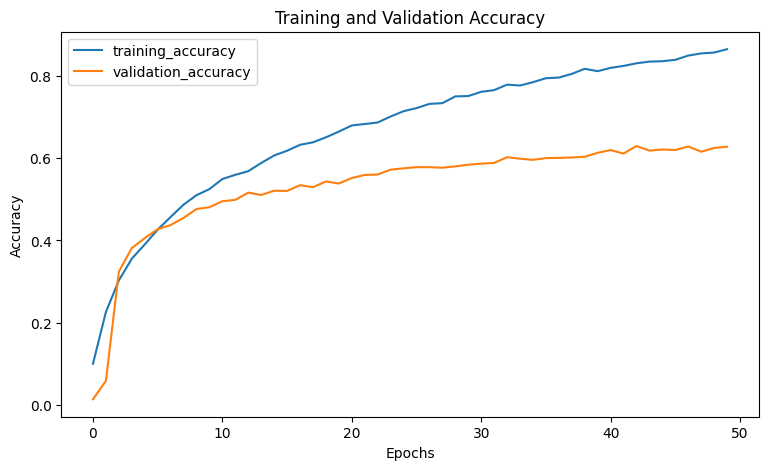

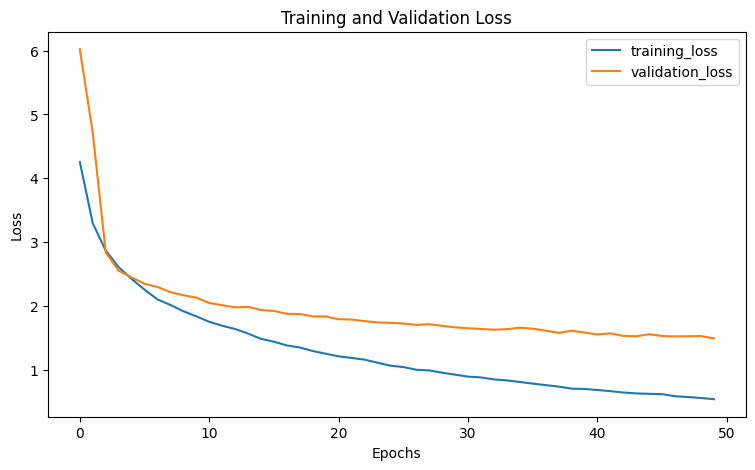

In [50]:
# Calling a function to plot accuracy and loss of training and validation test
plot_accuracy_loss(history_seq)

## Evaluation Stage

In [51]:
# Evaluating the trained model on the test data generator
model.evaluate(test_data_gen)

32/32 [==============================] - 3s 94ms/step - loss: 1.3211 - accuracy: 0.7310


[1.3210725784301758, 0.7310000061988831]

In [52]:
# make predictions on the test data using the trained sequential model
preds_seq = model.predict(test_data_gen).,

32/32 [==============================] - 1s 22ms/step


# Sample Prediction

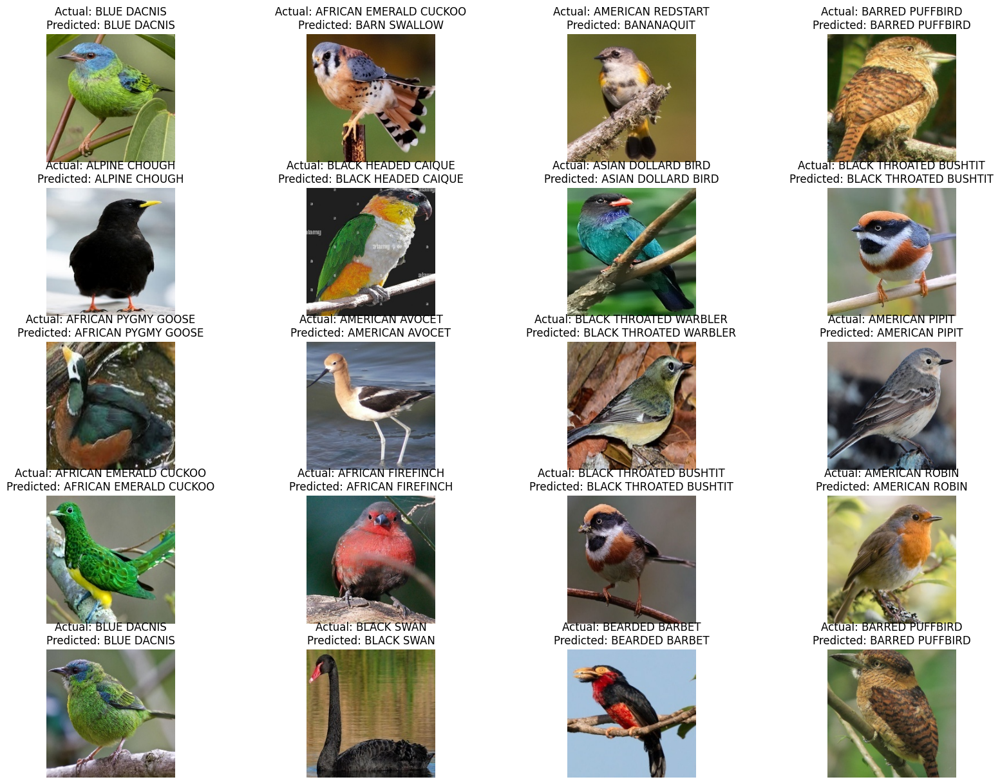

In [53]:
predictImages(test_data_gen, species_types, incep_model)

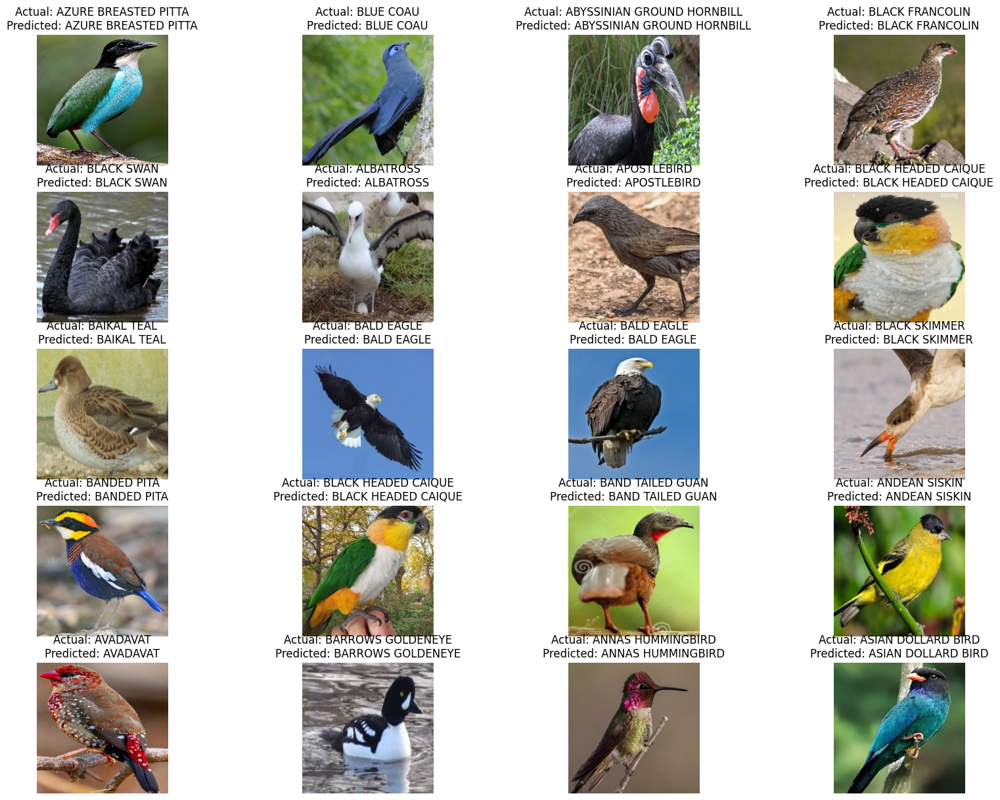

In [54]:
predictImages(test_data_gen, species_types, mobile_model)

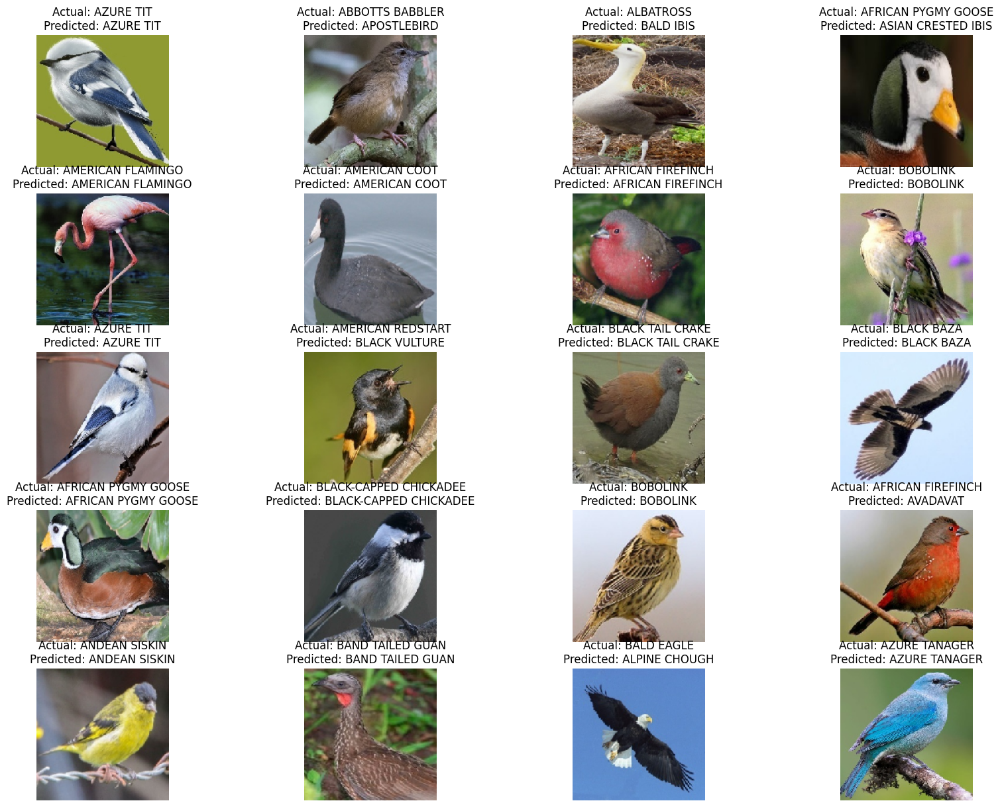

In [55]:
predictImages(testdata_gen, species_types, seqmodel)

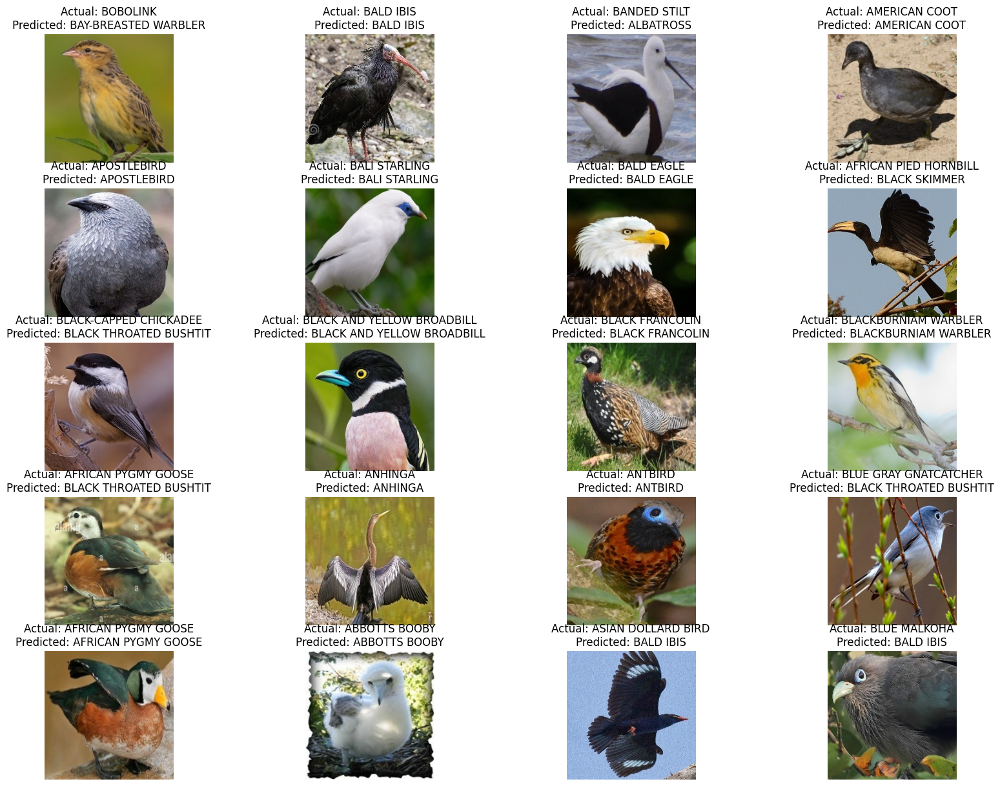

In [58]:
predictImages(test_data_gen, species_types, model)